Detected 11 plastic items in 0.05 seconds


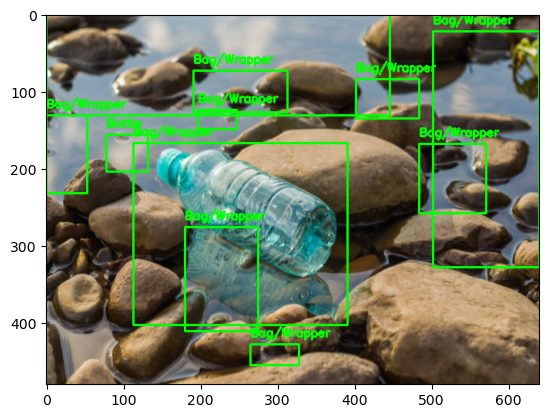

In [3]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import os

def detect_plastic(image_path):
    # Load and resize image (simulate robot camera: 640x480)
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return None, 0
    original = img.copy()  # For output
    img = cv2.resize(img, (640, 480))
    
    # Step 1: Multi-color thresholding in HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Color ranges for various plastics (tuned for bottles, bags, wrappers)
    # Transparent/White: High value, low saturation
    lower_white = np.array([0, 0, 180])
    upper_white = np.array([180, 50, 255])
    mask_white = cv2.inRange(hsv, lower_white, upper_white)
    
    # Blue (common bottles)
    lower_blue = np.array([90, 50, 50])
    upper_blue = np.array([130, 255, 255])
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
    
    # Green (bottles like Sprite)
    lower_green = np.array([40, 40, 40])
    upper_green = np.array([80, 255, 255])
    mask_green = cv2.inRange(hsv, lower_green, upper_green)
    
    # Yellow/Orange (containers, wrappers)
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([40, 255, 255])
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # Red/Pink (some wrappers/bottles)
    lower_red1 = np.array([0, 100, 100])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([160, 100, 100])
    upper_red2 = np.array([180, 255, 255])
    mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)
    
    # Combine all color masks
    color_mask = mask_white | mask_blue | mask_green | mask_yellow | mask_red
    
    # Step 2: Adaptive thresholding for lighting variations + edges
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    edges = cv2.Canny(gray, 50, 150)
    
    # Combine color mask with adaptive thresh and edges for robustness
    combined_mask = cv2.bitwise_or(color_mask, adaptive_thresh)
    combined_mask = cv2.bitwise_or(combined_mask, edges)
    
    # Step 3: Morphological operations to clean (larger kernel for outdoor noise)
    kernel = np.ones((7, 7), np.uint8)  # Larger for better blob connection
    combined_mask = cv2.erode(combined_mask, kernel, iterations=1)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=2)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)  # Close gaps
    
    # Step 4: Find and filter contours
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    detected = []
    min_area = 600  # Adjust based on res (ignore tiny noise)
    max_area = 100000  # Ignore huge blobs (e.g., background)
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area or area > max_area:
            continue
        
        # Shape approximation
        approx = cv2.approxPolyDP(cnt, 0.02 * cv2.arcLength(cnt, True), closed=True)
        
        # Circularity (high for bottles, low for bags)
        perimeter = cv2.arcLength(cnt, True)
        circularity = 4 * np.pi * area / (perimeter ** 2) if perimeter > 0 else 0
        
        # Solidity (area / convex hull area) - high for solid shapes, low for irregular/concave like wrinkled bags
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = area / hull_area if hull_area > 0 else 0
        
        # Filter: Bottles (med-high circularity, high solidity), Bags/Wrappers (low circularity, med-low solidity)
        if (0.4 < circularity < 0.9 and solidity > 0.7) or (circularity < 0.5 and solidity < 0.7 and len(approx) > 8):
            x, y, w, h = cv2.boundingRect(cnt)
            detected.append((x, y, w, h))
            
            # Label based on shape (for report visualization)
            label = "Bottle" if circularity > 0.5 else "Bag/Wrapper"
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Step 5: Return output image and count
    return img, len(detected)

# Batch testing function for report evaluation
def batch_test(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    results = []
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.jpg', '.png')):
            path = os.path.join(input_folder, filename)
            start_time = time.time()
            output_img, num_detected = detect_plastic(path)
            if output_img is not None:
                time_taken = time.time() - start_time
                print(f"{filename}: Detected {num_detected} plastics in {time_taken:.2f} seconds")
                results.append((filename, num_detected, time_taken))
                out_path = os.path.join(output_folder, f"detected_{filename}")
                cv2.imwrite(out_path, output_img)
    # Summary table (print for report copy-paste)
    print("\nSummary Table:")
    print("| Image | Detected | Time (s) |")
    print("|-------|----------|----------|")
    for res in results:
        print(f"| {res[0]} | {res[1]} | {res[2]:.2f} |")

# Example usage
if __name__ == "__main__":
    # Single image test (replace with your path)
    start_time = time.time()
    output_img, num_detected = detect_plastic(r"C:\Users\User\OneDrive\Documents\Capstone\Input_image\istockphoto-944160034-612x612.jpg")
    if output_img is not None:
        print(f"Detected {num_detected} plastic items in {time.time() - start_time:.2f} seconds")
        plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
        plt.show()
        cv2.imwrite("output_detected.jpg", output_img)
    
    # Batch test (uncomment and set folders)
    # batch_test("input_images/", "output_images/")

Detected 9 plastic items in 0.37 seconds


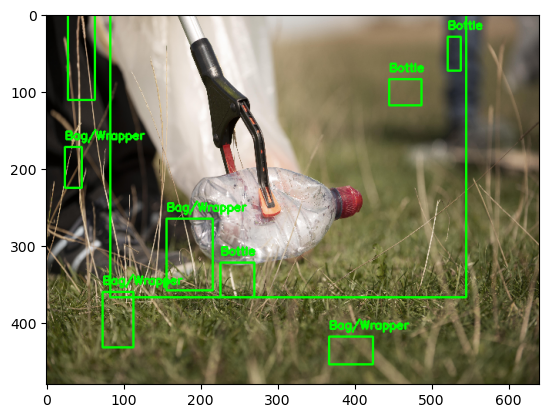

In [4]:
# Example usage
if __name__ == "__main__":
    # Single image test (replace with your path)
    start_time = time.time()
    output_img, num_detected = detect_plastic(r"C:\Users\User\Downloads\person-doing-community-service-by-collecting-trash.jpg")
    if output_img is not None:
        print(f"Detected {num_detected} plastic items in {time.time() - start_time:.2f} seconds")
        plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
        plt.show()
        cv2.imwrite("output_detected.jpg", output_img)
    

Detected 8 plastics
Bag/Wrapper → Distance ≈ 708.3 cm
Plastic → Distance ≈ 379.5 cm
Bag/Wrapper → Distance ≈ 354.2 cm
Bottle → Distance ≈ 472.2 cm
Bottle → Distance ≈ 518.3 cm
Bottle → Distance ≈ 625.0 cm
Bag/Wrapper → Distance ≈ 293.1 cm
Bottle → Distance ≈ 483.0 cm


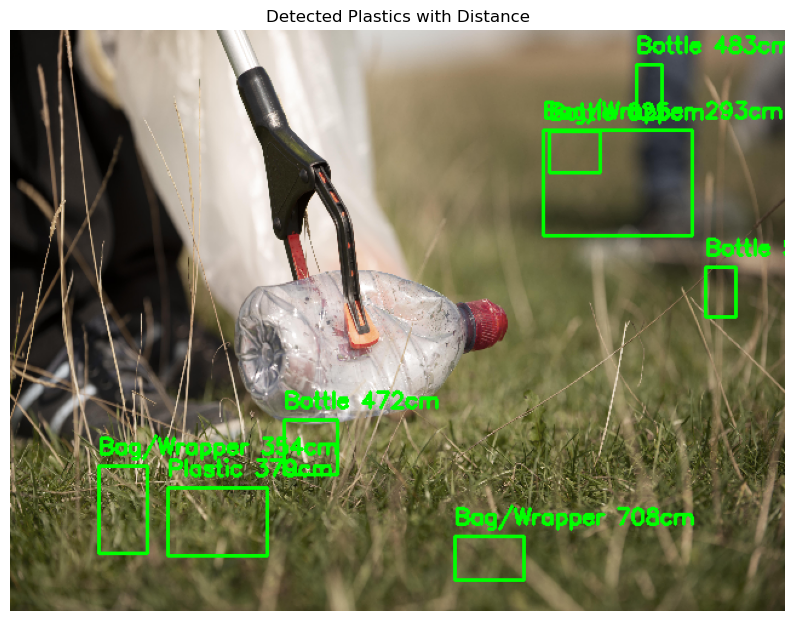

In [5]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import os

def detect_plastic_with_distance(image_path, focal_length_px=800):
    """
    Detect plastics and estimate distance using known approximate real height.
    focal_length_px: Camera focal length in pixels (calibrate or approximate)
    """
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return None, 0, []
    
    original = img.copy()
    img = cv2.resize(img, (640, 480))
    h, w = img.shape[:2]
    
    # ------------------ [Previous Detection Pipeline - Multi-color + Adaptive + Edges] ------------------
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Color masks (including black plastics - low brightness/value)
    lower_black = np.array([0, 0, 0])
    upper_black = np.array([180, 255, 60])       # Low V channel for black/dark plastics
    mask_black = cv2.inRange(hsv, lower_black, upper_black)
    
    lower_white   = np.array([0,   0, 180])
    upper_white   = np.array([180, 50, 255])
    mask_white = cv2.inRange(hsv, lower_white, upper_white)
    
    lower_blue    = np.array([90,  50, 50])
    upper_blue    = np.array([130,255,255])
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
    
    lower_green   = np.array([40,  40, 40])
    upper_green   = np.array([80, 255,255])
    mask_green = cv2.inRange(hsv, lower_green, upper_green)
    
    lower_yellow  = np.array([20, 100,100])
    upper_yellow  = np.array([40, 255,255])
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    lower_red1    = np.array([0,  100,100])
    upper_red1    = np.array([10, 255,255])
    lower_red2    = np.array([160,100,100])
    upper_red2    = np.array([180,255,255])
    mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)
    
    color_mask = mask_white | mask_blue | mask_green | mask_yellow | mask_red | mask_black
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                            cv2.THRESH_BINARY_INV, 11, 2)
    edges = cv2.Canny(gray, 50, 150)
    
    combined_mask = cv2.bitwise_or(color_mask, adaptive_thresh)
    combined_mask = cv2.bitwise_or(combined_mask, edges)
    
    kernel = np.ones((7,7), np.uint8)
    combined_mask = cv2.erode(combined_mask, kernel, iterations=1)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=2)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    detections = []  # List of (x, y, w, h, label, distance_cm)
    min_area = 600
    max_area = 100000
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area or area > max_area:
            continue
        
        perimeter = cv2.arcLength(cnt, True)
        circularity = 4 * np.pi * area / (perimeter ** 2) if perimeter > 0 else 0
        
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = area / hull_area if hull_area > 0 else 0
        
        # Classify shape → assign approximate real height in cm
        if circularity > 0.5 and solidity > 0.7:
            label = "Bottle"
            real_height_cm = 25.0      # Average PET bottle height (tune: 20-30 cm)
        elif circularity < 0.5 and solidity < 0.7:
            label = "Bag/Wrapper"
            real_height_cm = 30.0      # Crumpled bag average vertical span
        else:
            label = "Plastic"
            real_height_cm = 25.0      # Default
        
        x, y, box_w, box_h = cv2.boundingRect(cnt)
        
        # Use vertical pixel height for distance (more stable for upright objects)
        pixel_height = box_h
        
        if pixel_height > 5:  # Avoid division by zero/tiny errors
            # Distance formula: distance = (real_size × focal_length) / pixel_size
            distance_cm = (real_height_cm * focal_length_px) / pixel_height
            
            detections.append((x, y, box_w, box_h, label, distance_cm))
            
            # Draw box + label + distance
            cv2.rectangle(img, (x, y), (x + box_w, y + box_h), (0, 255, 0), 2)
            text = f"{label} {distance_cm:.0f}cm"
            cv2.putText(img, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    
    return img, len(detections), detections

# Batch testing example
def batch_test_with_distance(input_folder, output_folder, focal_length=800):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    results = []
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.jpg', '.png')):
            path = os.path.join(input_folder, filename)
            start = time.time()
            output_img, num, dets = detect_plastic_with_distance(path, focal_length)
            if output_img is not None:
                t = time.time() - start
                print(f"{filename}: {num} plastics | Times: {t:.2f}s")
                for d in dets:
                    print(f"  → {d[4]} at ≈ {d[5]:.0f} cm")
                out_path = os.path.join(output_folder, f"dist_{filename}")
                cv2.imwrite(out_path, output_img)
                results.append((filename, num, t, dets))
    return results

# Example single image run
if __name__ == "__main__":
    # Tune focal_length based on your camera (e.g., 700-1100 for PiCam)
    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\person-doing-community-service-by-collecting-trash.jpg",          # Replace with real path
        focal_length_px=850             # Example value – calibrate!
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")
        
        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()
        
        cv2.imwrite("output_with_distance.jpg", img_out)

Detected 5 plastics
Plastic → Distance ≈ 425.0 cm
Bottle → Distance ≈ 198.6 cm
Bottle → Distance ≈ 1118.4 cm
Plastic → Distance ≈ 664.1 cm
Bottle → Distance ≈ 664.1 cm


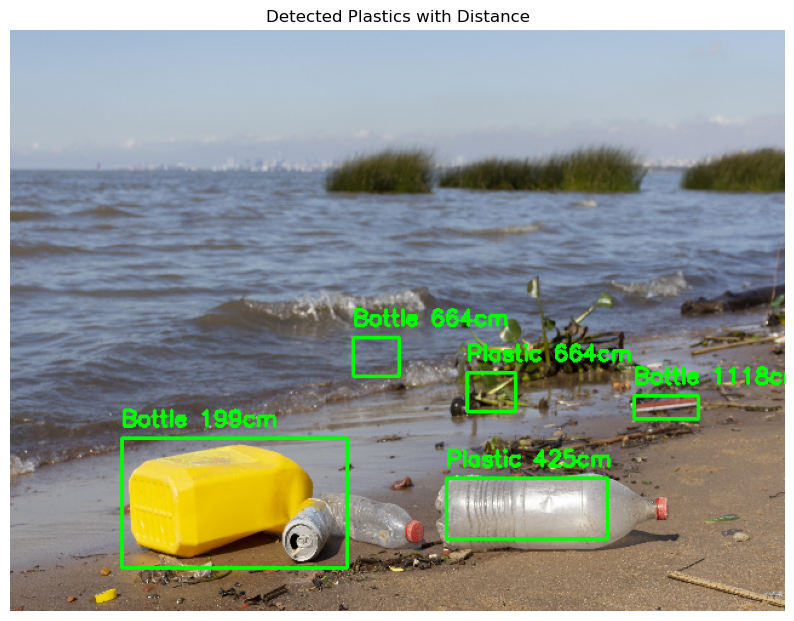

In [8]:
# Example single image run
if __name__ == "__main__":
    # Tune focal_length based on your camera (e.g., 700-1100 for PiCam)
    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\pollution-concept-with-plastic-waste.jpg",          # Replace with real path
        focal_length_px=850             # Example value – calibrate!
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")
        
        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()
        
        cv2.imwrite("output_with_distance.jpg", img_out)

In [ ]:
Test the distance accurecy..

Detected 7 plastics
Bottle → Distance ≈ 518.3 cm
Bag/Wrapper → Distance ≈ 336.9 cm
Bottle → Distance ≈ 460.7 cm
Plastic → Distance ≈ 364.2 cm
Bottle → Distance ≈ 323.8 cm
Plastic → Distance ≈ 267.4 cm
Plastic → Distance ≈ 296.2 cm


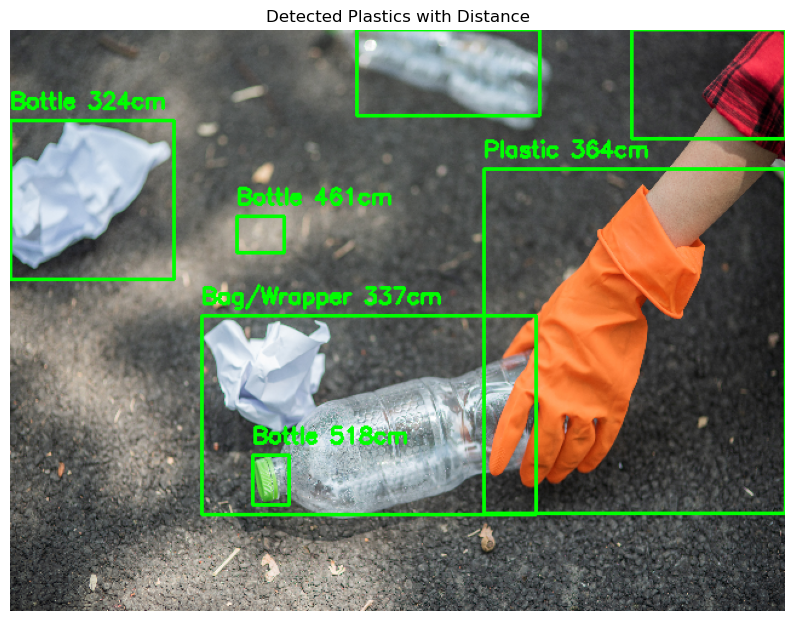

In [4]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import os
from collections import deque

# ------------------ Camera Calibration ------------------
def calibrate_camera(calib_images_folder, checkerboard=(7,7)):
    """
    Calibrate camera using checkerboard images.
    Returns focal length in pixels and camera matrix.
    """
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    objp = np.zeros((checkerboard[0]*checkerboard[1],3), np.float32)
    objp[:,:2] = np.mgrid[0:checkerboard[0],0:checkerboard[1]].T.reshape(-1,2)

    objpoints, imgpoints = [], []
    images = [f for f in os.listdir(calib_images_folder) if f.endswith(('.jpg','.png'))]

    for fname in images:
        img = cv2.imread(os.path.join(calib_images_folder, fname))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, checkerboard, None)
        if ret:
            objpoints.append(objp)
            corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
            imgpoints.append(corners2)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    focal_length_px = mtx[0,0]  # fx from camera matrix
    return focal_length_px, mtx


# ------------------ Detection with Distance ------------------
def detect_plastic_with_distance(image_path, focal_length_px=800, smoothing_window=5):
    """
    Detect plastics and estimate distance using known approximate real height.
    Includes mask refinement and distance smoothing.
    """
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return None, 0, []
    
    img = cv2.resize(img, (640, 480))
    h, w = img.shape[:2]

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Color masks
    masks = []
    masks.append(cv2.inRange(hsv, np.array([0,0,0]), np.array([180,255,60])))   # black
    masks.append(cv2.inRange(hsv, np.array([0,0,180]), np.array([180,50,255]))) # white
    masks.append(cv2.inRange(hsv, np.array([90,50,50]), np.array([130,255,255]))) # blue
    masks.append(cv2.inRange(hsv, np.array([40,40,40]), np.array([80,255,255])))  # green
    masks.append(cv2.inRange(hsv, np.array([20,100,100]), np.array([40,255,255]))) # yellow
    masks.append(cv2.inRange(hsv, np.array([0,100,100]), np.array([10,255,255])) |
                 cv2.inRange(hsv, np.array([160,100,100]), np.array([180,255,255]))) # red

    color_mask = masks[0]
    for m in masks[1:]:
        color_mask = cv2.bitwise_or(color_mask, m)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                            cv2.THRESH_BINARY_INV, 11, 2)
    edges = cv2.Canny(gray, 50, 150)

    combined_mask = cv2.bitwise_or(color_mask, adaptive_thresh)
    combined_mask = cv2.bitwise_or(combined_mask, edges)

    kernel = np.ones((7,7), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)   # remove specks
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)  # fill gaps

    contours, hierarchy = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detections = []
    min_area, max_area = 600, 100000
    distance_buffer = deque(maxlen=smoothing_window)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area or area > max_area:
            continue

        perimeter = cv2.arcLength(cnt, True)
        circularity = 4*np.pi*area/(perimeter**2) if perimeter>0 else 0
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = area/hull_area if hull_area>0 else 0

        if circularity > 0.5 and solidity > 0.7:
            label, real_height_cm = "Bottle", 25.0
        elif circularity < 0.5 and solidity < 0.7:
            label, real_height_cm = "Bag/Wrapper", 30.0
        else:
            label, real_height_cm = "Plastic", 25.0

        x,y,box_w,box_h = cv2.boundingRect(cnt)
        pixel_height = box_h

        if pixel_height > 5:
            distance_cm = (real_height_cm * focal_length_px) / pixel_height
            distance_buffer.append(distance_cm)
            smoothed_distance = np.mean(distance_buffer)

            detections.append((x,y,box_w,box_h,label,smoothed_distance))
            cv2.rectangle(img, (x,y), (x+box_w,y+box_h), (0,255,0), 2)
            cv2.putText(img, f"{label} {smoothed_distance:.0f}cm", (x,y-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    return img, len(detections), detections


# ------------------ Batch Testing ------------------
def batch_test_with_distance(input_folder, output_folder, focal_length=800):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    results = []
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.jpg','.png')):
            path = os.path.join(input_folder, filename)
            start = time.time()
            output_img, num, dets = detect_plastic_with_distance(path, focal_length)
            if output_img is not None:
                t = time.time() - start
                print(f"{filename}: {num} plastics | Time: {t:.2f}s")
                for d in dets:
                    print(f"  → {d[4]} at ≈ {d[5]:.0f} cm")
                out_path = os.path.join(output_folder, f"dist_{filename}")
                cv2.imwrite(out_path, output_img)
                results.append((filename, num, t, dets))
    # Summary
    avg_time = np.mean([r[2] for r in results]) if results else 0
    avg_count = np.mean([r[1] for r in results]) if results else 0
    print(f"\nSummary: Avg detections={avg_count:.2f}, Avg time={avg_time:.2f}s")
    return results


# ------------------ Example Run ------------------
if __name__ == "__main__":
    # Optional: calibrate focal length using checkerboard images
    # focal_length_px, cam_matrix = calibrate_camera("calibration_images")

    focal_length_px = 850  # Replace with calibrated value if available

    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\woman-collecting-garbage-black-bag.jpg",
        focal_length_px=focal_length_px
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_with_distance.jpg", img_out)


Detected 7 plastics
Bag/Wrapper → Distance ≈ 167.8 cm
Bag/Wrapper → Distance ≈ 268.7 cm
Plastic → Distance ≈ 284.8 cm
Bag/Wrapper → Distance ≈ 236.4 cm
Plastic → Distance ≈ 255.5 cm
Bottle → Distance ≈ 300.7 cm
Plastic → Distance ≈ 253.3 cm


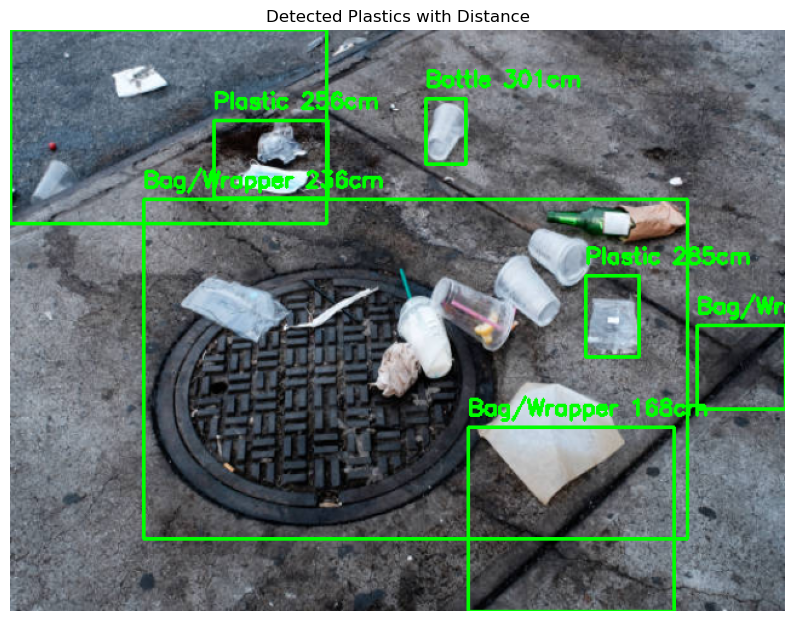

In [5]:
    # ------------------ Example Run ------------------
if __name__ == "__main__":
    # Optional: calibrate focal length using checkerboard images
    # focal_length_px, cam_matrix = calibrate_camera("calibration_images")

    focal_length_px = 850  # Replace with calibrated value if available

    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\istockphoto-1386181916-612x612.jpg",
        focal_length_px=focal_length_px
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_with_distance.jpg", img_out)

Detected 5 plastics
Plastic → Distance ≈ 137.1 cm
Bag/Wrapper → Distance ≈ 432.8 cm
Bag/Wrapper → Distance ≈ 336.0 cm
Plastic → Distance ≈ 403.8 cm
Plastic → Distance ≈ 650.0 cm


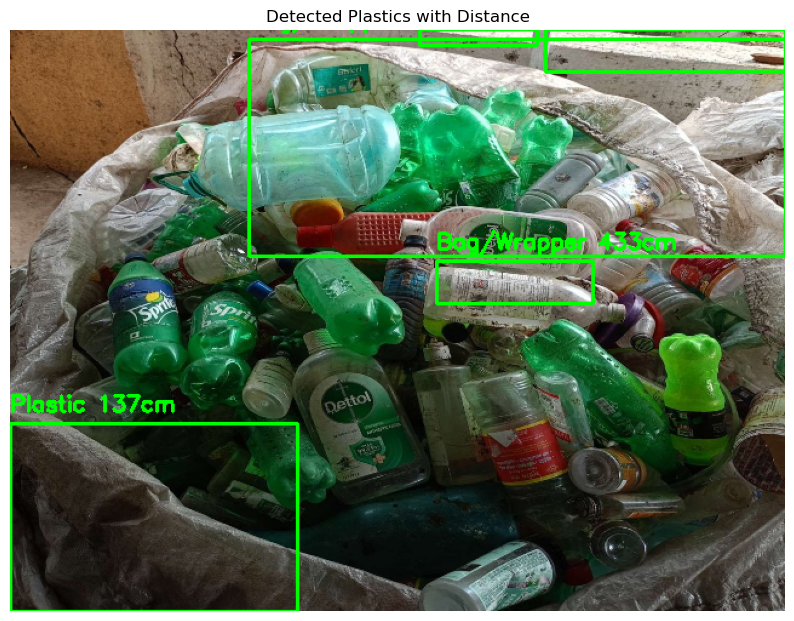

In [8]:
    # ------------------ Example Run ------------------
if __name__ == "__main__":
    # Optional: calibrate focal length using checkerboard images
    # focal_length_px, cam_matrix = calibrate_camera("calibration_images")

    focal_length_px = 850  # Replace with calibrated value if available

    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\waste-plastic-bottle-scrap.jpg",
        focal_length_px=focal_length_px
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_with_distance.jpg", img_out)

Detected 2 plastics
Plastic → Distance ≈ 1180.6 cm
Plastic → Distance ≈ 657.5 cm


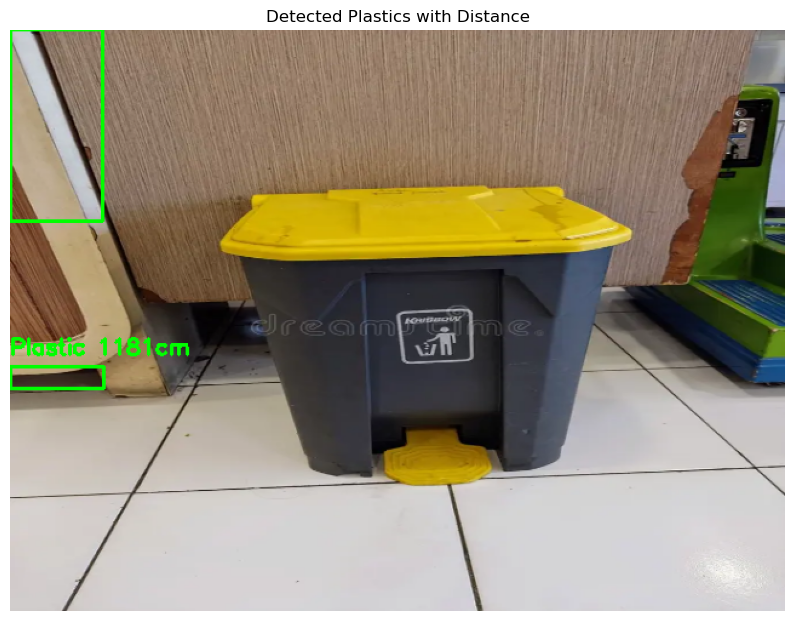

In [11]:
    # ------------------ Example Run ------------------
if __name__ == "__main__":
    # Optional: calibrate focal length using checkerboard images
    # focal_length_px, cam_matrix = calibrate_camera("calibration_images")

    focal_length_px = 850  # Replace with calibrated value if available

    img_out, count, details = detect_plastic_with_distance(
        r"C:\Users\User\Downloads\garbage-dumps-public-places-garbage-dumps-public-places-420586469.webp",
        focal_length_px=focal_length_px
    )
    if img_out is not None:
        print(f"Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_with_distance.jpg", img_out)

In [12]:
def detect_plastic_with_distance(image_path, focal_length_px=800, smoothing_window=5, use_kmeans=True):
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return None, 0, []
    
    img = cv2.resize(img, (640, 480))
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # --- Existing color masks ---
    masks = []
    masks.append(cv2.inRange(hsv, np.array([0,0,0]), np.array([180,255,60])))   # black
    masks.append(cv2.inRange(hsv, np.array([0,0,180]), np.array([180,50,255]))) # white
    masks.append(cv2.inRange(hsv, np.array([90,50,50]), np.array([130,255,255]))) # blue
    masks.append(cv2.inRange(hsv, np.array([40,40,40]), np.array([80,255,255])))  # green
    masks.append(cv2.inRange(hsv, np.array([20,100,100]), np.array([40,255,255]))) # yellow
    masks.append(cv2.inRange(hsv, np.array([0,100,100]), np.array([10,255,255])) |
                 cv2.inRange(hsv, np.array([160,100,100]), np.array([180,255,255]))) # red

    color_mask = masks[0]
    for m in masks[1:]:
        color_mask = cv2.bitwise_or(color_mask, m)

    # --- NEW: Saturation/Value emphasis ---
    sat_mask = cv2.inRange(hsv, np.array([0,80,80]), np.array([180,255,255]))
    color_mask = cv2.bitwise_or(color_mask, sat_mask)

    # --- NEW: K-means clustering for unusual colors ---
    if use_kmeans:
        Z = img.reshape((-1,3))
        Z = np.float32(Z)
        K = 4  # number of clusters
        _, labels, centers = cv2.kmeans(Z, K, None,
                                        (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0),
                                        10, cv2.KMEANS_RANDOM_CENTERS)
        centers = np.uint8(centers)
        clustered = centers[labels.flatten()].reshape(img.shape)
        clustered_gray = cv2.cvtColor(clustered, cv2.COLOR_BGR2GRAY)
        _, cluster_mask = cv2.threshold(clustered_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        color_mask = cv2.bitwise_or(color_mask, cluster_mask)

    # --- Continue with adaptive threshold + edges ---
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                            cv2.THRESH_BINARY_INV, 11, 2)
    edges = cv2.Canny(gray, 50, 150)

    combined_mask = cv2.bitwise_or(color_mask, adaptive_thresh)
    combined_mask = cv2.bitwise_or(combined_mask, edges)

    kernel = np.ones((7,7), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)

    # --- Continue with contour detection (same as before) ---
    # ...


✅ Detected 1 plastics
Bag/Wrapper → Distance ≈ 772.7 cm


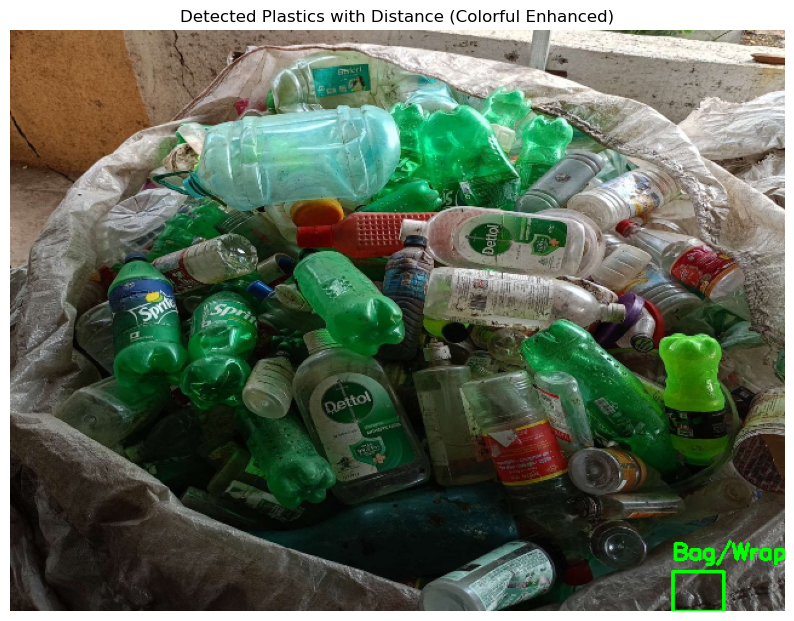

Bottle.png: 0 plastics | Time: 0.39s
bottle_image.jpg: 1 plastics | Time: 0.34s
  → Bag/Wrapper at ≈ 944 cm
depositphotos_203845294-stock-photo-green-plastic-bottle-cotton-swabs.jpg: 2 plastics | Time: 0.33s
  → Plastic at ≈ 1062 cm
  → Plastic at ≈ 599 cm
istockphoto-944160034-612x612.jpg: 0 plastics | Time: 0.34s

Summary: Avg detections=0.75, Avg time=0.35s


In [23]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import os
from collections import deque

def detect_plastic_with_distance(image_path, focal_length_px=800, smoothing_window=5, use_kmeans=True):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading image: {image_path}")
        return None, 0, []
    
    img = cv2.resize(img, (640, 480))
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # --- Existing color masks ---
    masks = []
    masks.append(cv2.inRange(hsv, np.array([0,0,0]), np.array([180,255,60])))   # black
    masks.append(cv2.inRange(hsv, np.array([0,0,180]), np.array([180,50,255]))) # white
    masks.append(cv2.inRange(hsv, np.array([90,50,50]), np.array([130,255,255]))) # blue
    masks.append(cv2.inRange(hsv, np.array([40,40,40]), np.array([80,255,255])))  # green
    masks.append(cv2.inRange(hsv, np.array([20,100,100]), np.array([40,255,255]))) # yellow
    masks.append(cv2.inRange(hsv, np.array([0,100,100]), np.array([10,255,255])) |
                 cv2.inRange(hsv, np.array([160,100,100]), np.array([180,255,255]))) # red

    color_mask = masks[0]
    for m in masks[1:]:
        color_mask = cv2.bitwise_or(color_mask, m)

    # --- NEW: Saturation/Value emphasis ---
    sat_mask = cv2.inRange(hsv, np.array([0,80,80]), np.array([180,255,255]))
    color_mask = cv2.bitwise_or(color_mask, sat_mask)

    # --- NEW: K-means clustering for unusual colors ---
    if use_kmeans:
        Z = img.reshape((-1,3))
        Z = np.float32(Z)
        K = 4  # number of clusters
        _, labels, centers = cv2.kmeans(Z, K, None,
                                        (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0),
                                        10, cv2.KMEANS_RANDOM_CENTERS)
        centers = np.uint8(centers)
        clustered = centers[labels.flatten()].reshape(img.shape)
        clustered_gray = cv2.cvtColor(clustered, cv2.COLOR_BGR2GRAY)
        _, cluster_mask = cv2.threshold(clustered_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        color_mask = cv2.bitwise_or(color_mask, cluster_mask)

    # --- Adaptive threshold + edges ---
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                            cv2.THRESH_BINARY_INV, 11, 2)
    edges = cv2.Canny(gray, 50, 150)

    combined_mask = cv2.bitwise_or(color_mask, adaptive_thresh)
    combined_mask = cv2.bitwise_or(combined_mask, edges)

    kernel = np.ones((7,7), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)

    # --- Contour detection ---
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detections = []
    min_area, max_area = 600, 100000
    distance_buffer = deque(maxlen=smoothing_window)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area or area > max_area:
            continue

        perimeter = cv2.arcLength(cnt, True)
        circularity = 4*np.pi*area/(perimeter**2) if perimeter>0 else 0
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = area/hull_area if hull_area>0 else 0

        if circularity > 0.5 and solidity > 0.7:
            label, real_height_cm = "Bottle", 25.0
        elif circularity < 0.5 and solidity < 0.7:
            label, real_height_cm = "Bag/Wrapper", 30.0
        else:
            label, real_height_cm = "Plastic", 25.0

        x,y,box_w,box_h = cv2.boundingRect(cnt)
        pixel_height = box_h

        if pixel_height > 5:
            distance_cm = (real_height_cm * focal_length_px) / pixel_height
            distance_buffer.append(distance_cm)
            smoothed_distance = np.mean(distance_buffer)

            detections.append((x,y,box_w,box_h,label,smoothed_distance))
            cv2.rectangle(img, (x,y), (x+box_w,y+box_h), (0,255,0), 2)
            cv2.putText(img, f"{label} {smoothed_distance:.0f}cm", (x,y-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    return img, len(detections), detections


def batch_test_with_distance(input_folder, output_folder, focal_length=800):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    results = []
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.jpg','.png')):
            path = os.path.join(input_folder, filename)
            start = time.time()
            output_img, num, dets = detect_plastic_with_distance(path, focal_length)
            if output_img is not None:
                t = time.time() - start
                print(f"{filename}: {num} plastics | Time: {t:.2f}s")
                for d in dets:
                    print(f"  → {d[4]} at ≈ {d[5]:.0f} cm")
                out_path = os.path.join(output_folder, f"dist_{filename}")
                cv2.imwrite(out_path, output_img)
                results.append((filename, num, t, dets))
    # Summary
    if results:
        avg_time = np.mean([r[2] for r in results])
        avg_count = np.mean([r[1] for r in results])
        print(f"\nSummary: Avg detections={avg_count:.2f}, Avg time={avg_time:.2f}s")
    return results


# ------------------ Example Run ------------------
if __name__ == "__main__":
    focal_length_px = 850  # Replace with calibrated value if available
    image_path = r"C:\Users\User\Downloads\waste-plastic-bottle-scrap.jpg"

    img_out, count, details = detect_plastic_with_distance(
        image_path,
        focal_length_px=focal_length_px,
        use_kmeans=True
    )

    if img_out is None:
        print(f"❌ Could not load or process image: {image_path}")
    else:
        print(f"✅ Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance (Colorful Enhanced)")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_colorful_with_distance.jpg", img_out)

    # Example batch run
    results = batch_test_with_distance(
        input_folder=r"C:\Users\User\Downloads\HSV Model\Input_image",
        output_folder=r"C:\Users\User\Downloads\HSV Model\results_colorful",
        focal_length=focal_length_px
    )


✅ Detected 2 plastics
Bag/Wrapper → Distance ≈ 622.0 cm
Plastic → Distance ≈ 434.5 cm


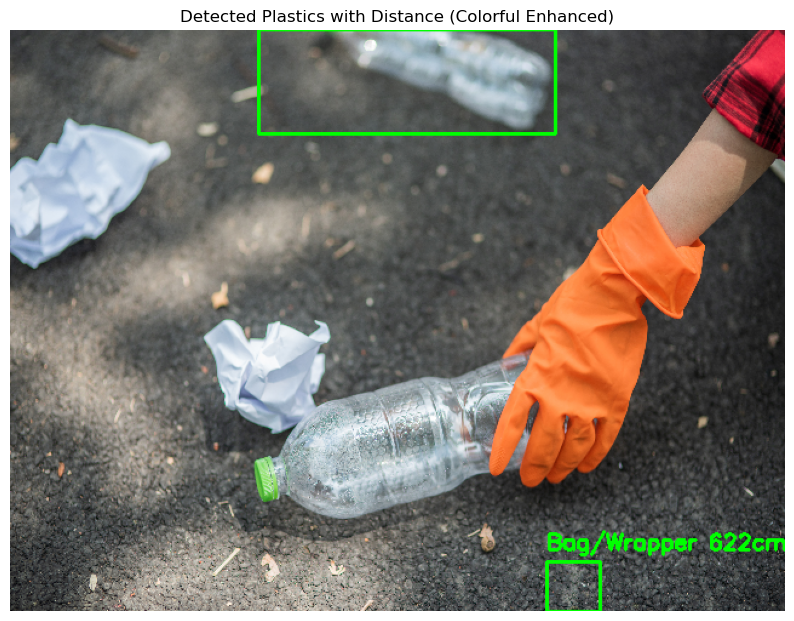

In [25]:
# ------------------ Example Run ------------------
if __name__ == "__main__":
    focal_length_px = 850  # Replace with calibrated value if available
    image_path = r"C:\Users\User\Downloads\woman-collecting-garbage-black-bag.jpg"

    img_out, count, details = detect_plastic_with_distance(
        image_path,
        focal_length_px=focal_length_px,
        use_kmeans=True
    )

    if img_out is None:
        print(f"❌ Could not load or process image: {image_path}")
    else:
        print(f"✅ Detected {count} plastics")
        for det in details:
            x,y,w,h,label,dist = det
            print(f"{label} → Distance ≈ {dist:.1f} cm")

        plt.figure(figsize=(10,8))
        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title("Detected Plastics with Distance (Colorful Enhanced)")
        plt.axis('off')
        plt.show()

        cv2.imwrite("output_colorful_with_distance.jpg", img_out)

  pollution-concept-with-plastic-waste.jpg |   0 detected |    26.7 ms | no detections


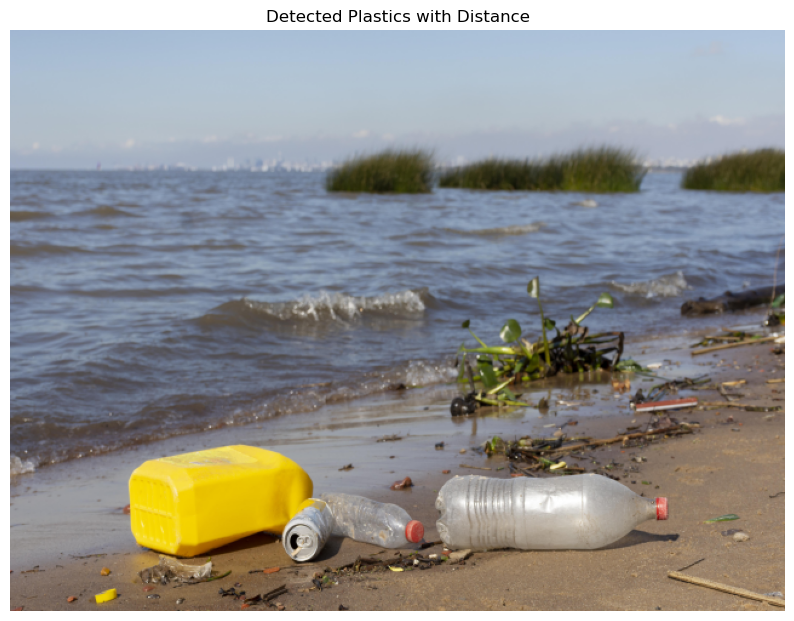

In [32]:
# =============================================================================
#  Plastic Waste Detector — Pure OpenCV + NumPy Pipeline
#  EEE400B Capstone | East West University, Dhaka
#  Autonomous Solar-Powered Plastic Waste Collector Robot
#  Author  : [Your Name]
#  Target  : Raspberry Pi 4/5 + Pi Camera | 640×480 | < 0.15 s/frame
# =============================================================================

import cv2
import numpy as np
import os
import time
from pathlib import Path

# ─────────────────────────────────────────────────────────────────────────────
#  TUNING PARAMETERS  ←  edit these to adapt to your environment
# ─────────────────────────────────────────────────────────────────────────────

# ── Camera / Distance ─────────────────────────────────────────────────────────
# To calibrate focal_length_px:
#   1. Place a bottle (real height = 25 cm) exactly 50 cm from the camera.
#   2. Measure its pixel height in the captured frame (e.g., 220 px).
#   3. focal_length_px = (pixel_height × known_distance_cm) / real_height_cm
#                      = (220 × 50) / 25 = 440
FOCAL_LENGTH_PX   = 600          # calibrate for your specific camera + lens
REAL_HEIGHTS_CM   = {
    "Bottle":      25.0,
    "Bag/Wrapper": 30.0,
    "Other Plastic": 20.0,
}

# ── Processing ────────────────────────────────────────────────────────────────
FRAME_WIDTH   = 640
FRAME_HEIGHT  = 480
DOWNSCALE     = 1.0              # set 0.5 to halve res for extra speed (then upscale boxes)

# ── Contour Area Thresholds (pixels²) ────────────────────────────────────────
MIN_AREA      = 800              # discard tiny noise blobs
MAX_AREA      = 180_000          # discard full-frame detections (reflections etc.)

# ── Shape Filter Thresholds ───────────────────────────────────────────────────
MIN_SOLIDITY      = 0.30         # very crumpled bags can be < 0.5
MIN_EXTENT        = 0.12         # ratio of contour area to bounding-rect area
MAX_VERTICES      = 28           # approxPolyDP — plastics rarely > 28 vertices
MIN_ASPECT        = 0.12         # width/height or height/width (handle any orientation)
MAX_CIRCULARITY   = 0.98         # exclude perfect circles (coins, wheels)
# (circularity lower bound is intentionally low — crumpled wrappers are irregular)
MIN_CIRCULARITY   = 0.04

# ── Morphology ────────────────────────────────────────────────────────────────
MORPH_KERNEL_SIZE = 5            # for noise removal / gap filling
CLOSE_ITER        = 3            # closing iterations (merges nearby fragments)
DILATE_ITER       = 2            # dilation iterations
ERODE_ITER        = 1            # erosion iterations (noise clean-up)

# ── Visualization ─────────────────────────────────────────────────────────────
BOX_COLOR     = (0, 220, 60)     # bright green bounding box (BGR)
TEXT_COLOR    = (255, 255, 255)
FONT          = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE    = 0.52
FONT_THICK    = 1

# ── Output ────────────────────────────────────────────────────────────────────
OUTPUT_DIR    = "output_detections"

# =============================================================================
#  HSV COLOR RANGES  — multi-range masks for all plastic colours
#  Format: list of (lower_hsv, upper_hsv) in OpenCV scale
#  H: 0-179 | S: 0-255 | V: 0-255
# =============================================================================

HSV_RANGES = {
    # ── Transparent / white (low saturation, high value) ─────────────────────
    "white_transparent": [
        (np.array([  0,   0, 180], np.uint8),
         np.array([179,  55, 255], np.uint8)),
    ],

    # ── Black / dark plastics (low saturation AND low value) ─────────────────
    "black_dark": [
        (np.array([  0,   0,   0], np.uint8),
         np.array([179,  80,  70], np.uint8)),
    ],

    # ── Blue (common bottles, bags) ───────────────────────────────────────────
    "blue": [
        (np.array([ 95,  60,  40], np.uint8),
         np.array([135, 255, 255], np.uint8)),
    ],

    # ── Green plastics (can overlap with grass — solidity/extent filters help) ─
    "green": [
        (np.array([ 36,  50,  40], np.uint8),
         np.array([ 90, 255, 255], np.uint8)),
    ],

    # ── Yellow / lime ────────────────────────────────────────────────────────
    "yellow": [
        (np.array([ 18,  60,  60], np.uint8),
         np.array([ 38, 255, 255], np.uint8)),
    ],

    # ── Red / orange (wraps around 0° in HSV — needs two sub-ranges) ─────────
    "red_orange": [
        (np.array([  0,  60,  50], np.uint8),
         np.array([ 18, 255, 255], np.uint8)),
        (np.array([158,  60,  50], np.uint8),
         np.array([179, 255, 255], np.uint8)),
    ],

    # ── Pink / violet / purple ────────────────────────────────────────────────
    "pink_purple": [
        (np.array([135,  40,  50], np.uint8),
         np.array([160, 255, 255], np.uint8)),
    ],

    # ── Metallic / silver / grey reflective plastics ─────────────────────────
    "grey_metallic": [
        (np.array([  0,   0,  80], np.uint8),
         np.array([179,  45, 185], np.uint8)),
    ],
}


# =============================================================================
#  HELPER: Build combined HSV mask from all colour ranges
# =============================================================================

def build_hsv_mask(hsv_frame: np.ndarray) -> np.ndarray:
    """
    Union of all HSV colour-range masks.
    Detects white, black, blue, green, yellow, red, orange, grey, pink plastics.
    """
    combined = np.zeros(hsv_frame.shape[:2], dtype=np.uint8)
    for _, ranges in HSV_RANGES.items():
        for (lo, hi) in ranges:
            combined = cv2.bitwise_or(combined,
                                      cv2.inRange(hsv_frame, lo, hi))
    return combined


# =============================================================================
#  HELPER: Build adaptive threshold mask (catches texture + edges on plastic)
# =============================================================================

def build_adaptive_mask(gray: np.ndarray) -> np.ndarray:
    """
    Gaussian adaptive thresholding on the gray frame.
    Highlights fine texture patterns common on plastic surfaces.
    Canny edges are fused in so that the outline of transparent items is kept.
    """
    # Adaptive threshold — block size must be odd
    adaptive = cv2.adaptiveThreshold(
        gray, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        blockSize=15, C=4
    )

    # Canny detects sharp edges (bottle shoulders, wrapper folds)
    edges = cv2.Canny(gray, threshold1=40, threshold2=120)

    # Dilate edges slightly before fusion so they connect into closed regions
    edge_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges_dilated = cv2.dilate(edges, edge_kernel, iterations=1)

    # Fuse: keep pixels that appear in adaptive OR on an edge
    fused = cv2.bitwise_or(adaptive, edges_dilated)
    return fused


# =============================================================================
#  HELPER: Morphological cleanup to join fragments and remove noise
# =============================================================================

def morph_clean(mask: np.ndarray) -> np.ndarray:
    """
    1. Erode  — remove single-pixel speckles
    2. Dilate — restore and slightly grow real blobs
    3. Close  — seal interior holes (transparent windows, reflections)
    """
    k  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
                                   (MORPH_KERNEL_SIZE, MORPH_KERNEL_SIZE))
    kl = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

    # Fine noise removal with small kernel first
    mask = cv2.erode (mask, kl, iterations=ERODE_ITER)
    mask = cv2.dilate(mask, k,  iterations=DILATE_ITER)

    # Large closing to fill gaps across whole object surface
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k, iterations=CLOSE_ITER)
    return mask


# =============================================================================
#  HELPER: Shape-based contour filter
# =============================================================================

def compute_shape_features(cnt: np.ndarray) -> dict:
    """
    Returns a dictionary of shape descriptors for a given contour.
    All values are cheap to compute and run fast on Raspberry Pi.
    """
    area = cv2.contourArea(cnt)
    if area < 1:
        return {}

    peri      = cv2.arcLength(cnt, True)
    hull      = cv2.convexHull(cnt)
    hull_area = cv2.contourArea(hull)
    x, y, w, h = cv2.boundingRect(cnt)

    circularity = (4 * np.pi * area / (peri * peri)) if peri > 0 else 0.0
    solidity    = (area / hull_area)                  if hull_area > 0 else 0.0
    extent      = (area / (w * h))                    if w * h > 0 else 0.0
    aspect      = min(w, h) / max(w, h)               if max(w, h) > 0 else 0.0

    approx    = cv2.approxPolyDP(cnt, 0.03 * peri, True)
    n_vertices = len(approx)

    return {
        "area":         area,
        "circularity":  circularity,
        "solidity":     solidity,
        "extent":       extent,
        "aspect":       aspect,
        "n_vertices":   n_vertices,
        "bbox":         (x, y, w, h),
        "pixel_height": h,
        "pixel_width":  w,
    }


def is_valid_plastic(feat: dict) -> bool:
    """
    Returns True if the shape features are consistent with plastic waste.
    Filters are intentionally inclusive (high recall) then trimmed
    by solidity / extent to reduce vegetation false positives.
    """
    if not feat:
        return False

    a   = feat["area"]
    sol = feat["solidity"]
    ext = feat["extent"]
    asp = feat["aspect"]
    cir = feat["circularity"]
    nv  = feat["n_vertices"]

    # Primary area gate
    if not (MIN_AREA <= a <= MAX_AREA):
        return False

    # Must have some solidity (crumpled bag ≥ 0.30)
    if sol < MIN_SOLIDITY:
        return False

    # Very low extent usually means branching vegetation
    if ext < MIN_EXTENT:
        return False

    # Aspect ratio gate (handle both portrait and landscape orientations)
    if asp < MIN_ASPECT:
        return False

    # Circularity sanity check (0.04 … 0.98)
    if not (MIN_CIRCULARITY <= cir <= MAX_CIRCULARITY):
        return False

    # Too many vertices → likely complex leaf/twig silhouette
    if nv > MAX_VERTICES:
        return False

    return True


# =============================================================================
#  HELPER: Classify plastic type from shape features
# =============================================================================

def classify_plastic(feat: dict) -> str:
    """
    Rule-based classifier using bounding-box aspect ratio,
    circularity, and solidity.

    Bottle      — tall/narrow OR round cross-section, high solidity
    Bag/Wrapper — wide, low circularity, moderate-to-low solidity
    Other Plastic — everything else that passes shape filters
    """
    asp = feat["aspect"]
    cir = feat["circularity"]
    sol = feat["solidity"]
    w   = feat["pixel_width"]
    h   = feat["pixel_height"]
    portrait = h >= w                # object taller than wide

    # ── Bottle heuristics ─────────────────────────────────────
    # Tall (portrait) and reasonably solid → upright bottle
    if portrait and asp < 0.60 and sol >= 0.55:
        return "Bottle"
    # Round (crushed bottle top-down view) or short & circular
    if cir >= 0.55 and sol >= 0.65:
        return "Bottle"

    # ── Bag / Wrapper heuristics ──────────────────────────────
    # Wide, irregular, or flat → bag or wrapper
    if not portrait and sol < 0.75:
        return "Bag/Wrapper"
    if cir < 0.35 and sol < 0.70:
        return "Bag/Wrapper"

    return "Other Plastic"


# =============================================================================
#  HELPER: Monocular distance estimation (triangle similarity)
# =============================================================================

def estimate_distance_cm(pixel_height: int, plastic_type: str) -> float:
    """
    distance = (real_height_cm × focal_length_px) / pixel_height

    Returns 0.0 if pixel_height is invalid.
    """
    if pixel_height <= 0:
        return 0.0
    real_h = REAL_HEIGHTS_CM.get(plastic_type, 20.0)
    return round((real_h * FOCAL_LENGTH_PX) / pixel_height, 1)


# =============================================================================
#  CORE: Single-frame detection pipeline
# =============================================================================

def detect_plastics(frame_bgr: np.ndarray) -> tuple[np.ndarray, list[dict]]:
    """
    Full detection pipeline for one BGR frame.

    Returns
    -------
    annotated : BGR image with bounding boxes drawn
    results   : list of dicts — one per detection
                keys: type, distance_cm, bbox (x,y,w,h), features
    """
    scale   = DOWNSCALE
    if scale != 1.0:
        h0, w0 = frame_bgr.shape[:2]
        frame_bgr = cv2.resize(frame_bgr,
                               (int(w0 * scale), int(h0 * scale)),
                               interpolation=cv2.INTER_AREA)

    # ── Step 1: Colour space conversions ────────────────────────────────────
    hsv  = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2HSV)
    gray = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)

    # ── Step 2: Noise pre-blur (preserves edges better than Gaussian blur) ──
    gray_blur = cv2.bilateralFilter(gray, d=7, sigmaColor=55, sigmaSpace=55)

    # ── Step 3: Multi-colour HSV mask ───────────────────────────────────────
    hsv_mask = build_hsv_mask(hsv)

    # ── Step 4: Adaptive threshold + Canny fusion mask ──────────────────────
    texture_edge_mask = build_adaptive_mask(gray_blur)

    # ── Step 5: Combine: pixel must appear in EITHER mask
    #    (OR fusion maximises recall; false positives controlled downstream)
    combined = cv2.bitwise_or(hsv_mask, texture_edge_mask)

    # ── Step 6: Morphological cleanup ───────────────────────────────────────
    cleaned = morph_clean(combined)

    # ── Step 7: Contour extraction ──────────────────────────────────────────
    contours, _ = cv2.findContours(cleaned, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)

    # ── Step 8: Filter + classify each contour ──────────────────────────────
    results   = []
    annotated = frame_bgr.copy()

    for cnt in contours:
        feat = compute_shape_features(cnt)

        if not is_valid_plastic(feat):
            continue

        ptype    = classify_plastic(feat)
        x, y, w, h = feat["bbox"]

        # Upscale bounding box coordinates if we downscaled the frame
        if scale != 1.0:
            inv = 1.0 / scale
            x, y, w, h = (int(x*inv), int(y*inv),
                          int(w*inv), int(h*inv))

        dist_cm  = estimate_distance_cm(feat["pixel_height"], ptype)

        results.append({
            "type":        ptype,
            "distance_cm": dist_cm,
            "bbox":        (x, y, w, h),
            "features":    feat,
        })

        # ── Draw bounding box ────────────────────────────────────────────────
        cv2.rectangle(annotated, (x, y), (x + w, y + h), BOX_COLOR, 2)

        # Label background pill
        label     = f"{ptype}  {dist_cm} cm" if dist_cm > 0 else ptype
        (tw, th), bl = cv2.getTextSize(label, FONT, FONT_SCALE, FONT_THICK)
        label_y   = max(y - 6, th + 6)
        cv2.rectangle(annotated,
                      (x, label_y - th - bl - 4),
                      (x + tw + 6, label_y + 2),
                      BOX_COLOR, -1)
        cv2.putText(annotated, label,
                    (x + 3, label_y - bl),
                    FONT, FONT_SCALE, TEXT_COLOR, FONT_THICK,
                    cv2.LINE_AA)

    return annotated, results


# =============================================================================
#  PUBLIC: Process a single image file
# =============================================================================

def process_image(image_path: str,
                  save:       bool = True,
                  verbose:    bool = True
                  ) -> tuple[np.ndarray, list[dict], float]:
    """
    Load, detect, optionally save, and return results for one image.

    Returns
    -------
    (annotated_frame, detections_list, elapsed_seconds)
    """
    image_path = str(image_path)
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")

    frame = cv2.imread(image_path)
    if frame is None:
        raise ValueError(f"OpenCV cannot read: {image_path}")

    # Resize to standard working resolution if needed
    fh, fw = frame.shape[:2]
    if (fw, fh) != (FRAME_WIDTH, FRAME_HEIGHT):
        frame = cv2.resize(frame, (FRAME_WIDTH, FRAME_HEIGHT),
                           interpolation=cv2.INTER_AREA)

    t0 = time.perf_counter()
    annotated, dets = detect_plastics(frame)
    elapsed = time.perf_counter() - t0

    if save:
        os.makedirs(OUTPUT_DIR, exist_ok=True)
        stem     = Path(image_path).stem
        out_path = os.path.join(OUTPUT_DIR, f"detected_{stem}.jpg")
        cv2.imwrite(out_path, annotated)
        if verbose:
            print(f"  → Saved: {out_path}")

    if verbose:
        print(f"  {Path(image_path).name:<30} | "
              f"{len(dets):>3} detected | "
              f"{elapsed*1000:>7.1f} ms | "
              + (f"avg dist: {sum(d['distance_cm'] for d in dets)/len(dets):.1f} cm"
                 if dets else "no detections"))

    return annotated, dets, elapsed


# =============================================================================
#  PUBLIC: Batch processing over a folder of images
# =============================================================================

def process_folder(input_dir: str) -> list[dict]:
    """
    Detect plastics in every image inside *input_dir*.
    Saves annotated copies to OUTPUT_DIR.
    Prints a formatted summary table for the design report.

    Returns list of per-image result dicts.
    """
    EXTS    = {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".webp"}
    paths   = sorted(p for p in Path(input_dir).iterdir()
                     if p.suffix.lower() in EXTS)

    if not paths:
        print(f"[WARNING] No images found in: {input_dir}")
        return []

    print(f"\n{'═'*72}")
    print(f"  Batch processing  —  {len(paths)} images  →  ./{OUTPUT_DIR}/")
    print(f"{'─'*72}")
    print(f"  {'Image':<28} | {'Det':>4} | {'Time(s)':>8} | {'Avg Dist (cm)':>14}")
    print(f"{'─'*72}")

    summary     = []
    total_dets  = 0
    total_time  = 0.0
    type_tally: dict[str, int] = {}

    for p in paths:
        try:
            _, dets, elapsed = process_image(str(p), save=True, verbose=False)
        except Exception as exc:
            print(f"  {'[ERROR] ' + p.name:<28} | {str(exc)}")
            continue

        n       = len(dets)
        avg_d   = (sum(d["distance_cm"] for d in dets) / n) if n else 0.0
        total_dets += n
        total_time += elapsed

        for d in dets:
            type_tally[d["type"]] = type_tally.get(d["type"], 0) + 1

        print(f"  {p.name:<28} | {n:>4} | {elapsed:>8.4f} | {avg_d:>13.1f}")

        summary.append({
            "image":        p.name,
            "n_detections": n,
            "elapsed_s":    elapsed,
            "avg_dist_cm":  avg_d,
            "detections":   dets,
        })

    # ── Summary statistics ────────────────────────────────────────────────────
    n_img = len(summary)
    print(f"{'─'*72}")
    print(f"  {'TOTAL / AVERAGE':<28} | {total_dets:>4} | "
          f"{(total_time/n_img):>8.4f} | "
          f"{(sum(s['avg_dist_cm'] for s in summary)/n_img if n_img else 0):>13.1f}")
    print(f"{'═'*72}")
    print(f"\n  Detection breakdown by type:")
    for t, c in sorted(type_tally.items()):
        print(f"    {t:<20} : {c}")
    print(f"\n  Images processed  : {n_img} / {len(paths)}")
    print(f"  Avg time / frame  : {total_time/n_img*1000:.1f} ms\n")

    return summary


# =============================================================================
#  OPTIONAL: Visualise with OpenCV window (for desktop / VNC testing on Pi)
# =============================================================================

def visualise_window(image_path: str) -> None:
    """
    Show detection result in an OpenCV window (non-blocking).
    Press any key to close.
    """
    annotated, dets, elapsed = process_image(image_path, save=False, verbose=True)
    win_title = f"Plastic Detector — {Path(image_path).name} — {len(dets)} obj"
    cv2.imshow(win_title, annotated)
    print("  [Press any key in the window to close]")
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# =============================================================================
#  OPTIONAL: Live camera stream (uncomment on Raspberry Pi)
# =============================================================================

def run_live_camera(camera_index: int = 0) -> None:
    """
    Real-time detection from Pi Camera or USB camera.
    Press 'q' to quit, 's' to save current frame.
    """
    cap = cv2.VideoCapture(camera_index)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH,  FRAME_WIDTH)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, FRAME_HEIGHT)

    if not cap.isOpened():
        print(f"[ERROR] Cannot open camera {camera_index}")
        return

    print("[INFO] Live stream started — 'q' to quit, 's' to save frame")
    frame_count = 0
    fps_acc     = 0.0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        t0 = time.perf_counter()
        annotated, dets = detect_plastics(frame)
        fps = 1.0 / max(time.perf_counter() - t0, 1e-6)
        fps_acc = 0.9 * fps_acc + 0.1 * fps       # exponential moving avg

        cv2.putText(annotated,
                    f"FPS: {fps_acc:.1f}  Objects: {len(dets)}",
                    (8, 22), FONT, 0.65, (0, 220, 60), 2, cv2.LINE_AA)

        cv2.imshow("Plastic Waste Detector", annotated)
        key = cv2.waitKey(1) & 0xFF

        if key == ord('q'):
            break
        if key == ord('s'):
            os.makedirs(OUTPUT_DIR, exist_ok=True)
            fname = os.path.join(OUTPUT_DIR, f"live_frame_{frame_count:04d}.jpg")
            cv2.imwrite(fname, annotated)
            print(f"  Saved: {fname}")

        frame_count += 1

    cap.release()
    cv2.destroyAllWindows()
    print(f"[INFO] Stream ended — {frame_count} frames processed")


# =============================================================================
#  ENTRY POINT
# =============================================================================

if __name__ == "__main__":

   
        import matplotlib.pyplot as plt

annotated, detections, _ = process_image(
    r"C:\Users\User\Downloads\pollution-concept-with-plastic-waste.jpg",
    save=False, verbose=True
)

# Show inline in Jupyter
plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Detected Plastics with Distance")
plt.show()


 

OpenCV version : 4.13.0
NumPy  version : 2.3.5
All imports OK ✓
Parameters loaded ✓
11 HSV ranges loaded ✓
Pipeline helpers defined ✓
Debug visualiser defined ✓
detect_plastics() defined ✓

════════════════════════════════════════════════════════════
  Testing: C:\Users\User\Downloads\woman-collecting-garbage-black-bag.jpg
════════════════════════════════════════════════════════════


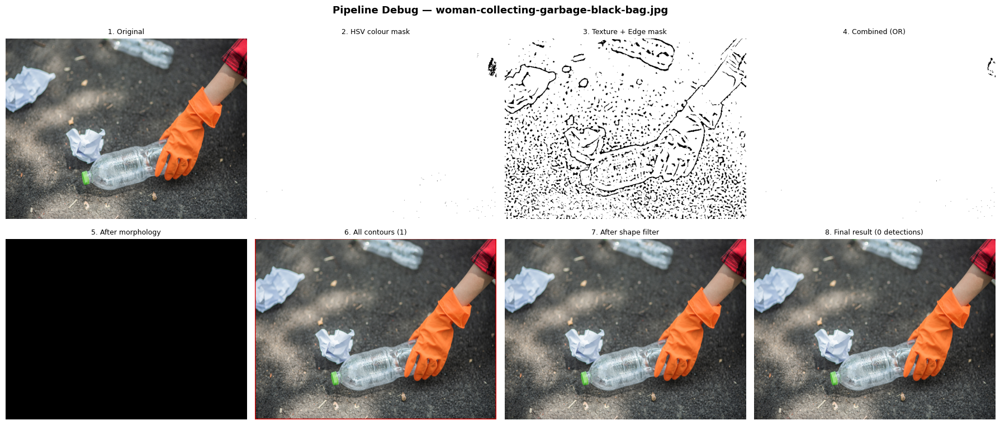


  Stage                        |  White px | % of frame
  ────────────────────────────────────────────────────
  HSV mask                     |   306,631 |      99.8 %
  Texture+Edge                 |   273,565 |      89.1 %
  Combined                     |   307,001 |      99.9 %
  After morph                  |   307,200 |     100.0 %

  Contours found  (no filter) : 1
  Contours kept (shape filter): 0
  Final detections            : 0

  HSV range        | Activated px |  % frame
  ────────────────────────────────────────────
  white            |       48,739 |    15.9%  ██████████████████████████████
  black            |       83,671 |    27.2%  ██████████████████████████████
  grey             |      157,840 |    51.4%  ██████████████████████████████
  blue             |       11,773 |     3.8%  ███████
  green            |        3,201 |     1.0%  ██
  yellow           |          674 |     0.2%  
  red_lo           |       29,368 |     9.6%  ███████████████████
  red_hi         

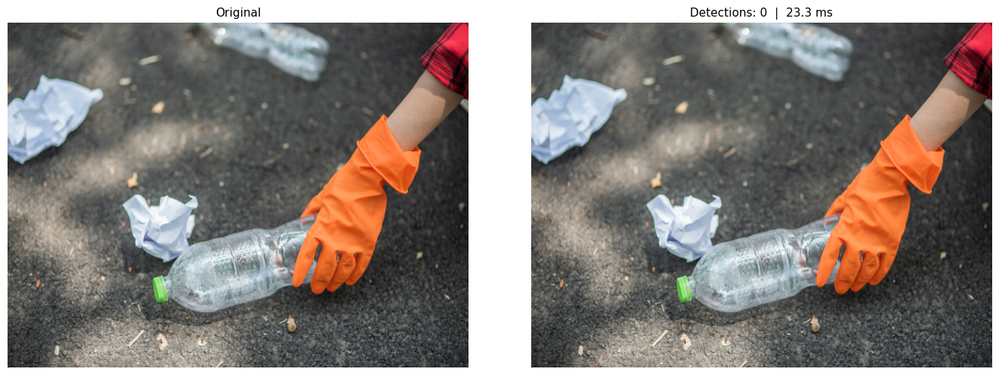


  ⚠  No detections — see tuning tips below:

  1. Lower MIN_AREA (currently 400 )
     → Try 200 if plastics are far away or small in frame
  2. Lower MIN_SOLIDITY (currently 0.2 )
     → Try 0.10 for heavily crumpled items
  3. Lower MIN_CIRCULARITY (currently 0.02 )
     → Try 0.01 for irregular wrappers
  4. Check the HSV mask in the debug plot (stage 2)
     → If it's mostly black, your plastic colour is missing
     → Sample the plastic colour with the HSV sampler in Cell 8
  5. Increase CLOSE_ITER to 5 if the morphed mask (stage 5)
     is fragmented


  ✅ Saved → output_detections\result_woman-collecting-garbage-black-bag.jpg
  ⏱  Processing time: 23.3 ms


████████████████████████████████████████████████████████████
  PLASTIC WASTE DETECTOR — NOTEBOOK DEBUG EDITION
████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════
  Testing: C:\Users\User\Downloads\woman-collecting-garbage-black-bag.jpg
══════════════════

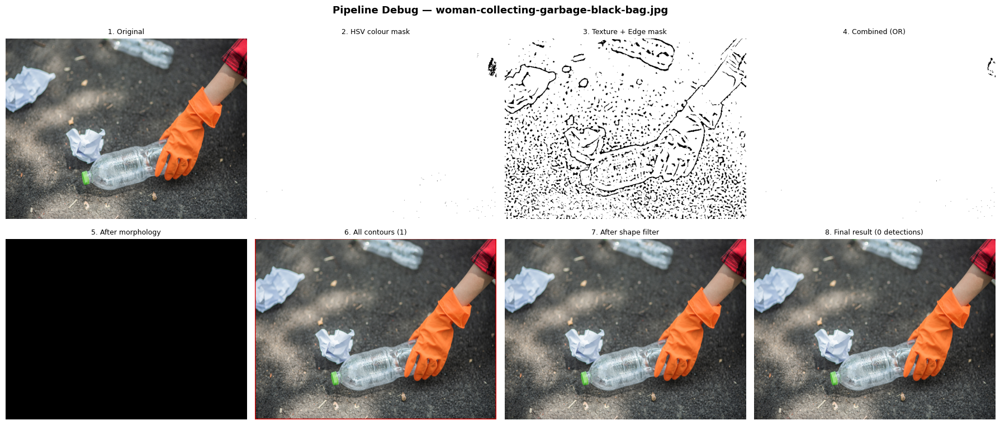


  Stage                        |  White px | % of frame
  ────────────────────────────────────────────────────
  HSV mask                     |   306,631 |      99.8 %
  Texture+Edge                 |   273,565 |      89.1 %
  Combined                     |   307,001 |      99.9 %
  After morph                  |   307,200 |     100.0 %

  Contours found  (no filter) : 1
  Contours kept (shape filter): 0
  Final detections            : 0

  HSV range        | Activated px |  % frame
  ────────────────────────────────────────────
  white            |       48,739 |    15.9%  ██████████████████████████████
  black            |       83,671 |    27.2%  ██████████████████████████████
  grey             |      157,840 |    51.4%  ██████████████████████████████
  blue             |       11,773 |     3.8%  ███████
  green            |        3,201 |     1.0%  ██
  yellow           |          674 |     0.2%  
  red_lo           |       29,368 |     9.6%  ███████████████████
  red_hi         

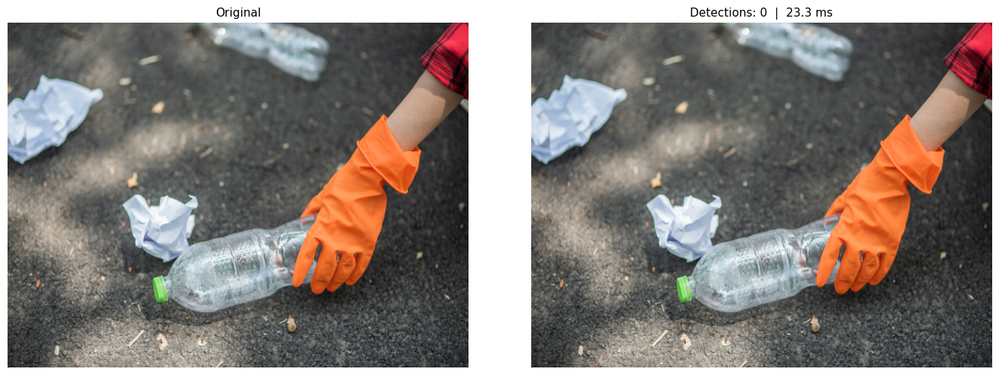


  ⚠  No detections — see tuning tips below:

  1. Lower MIN_AREA (currently 400 )
     → Try 200 if plastics are far away or small in frame
  2. Lower MIN_SOLIDITY (currently 0.2 )
     → Try 0.10 for heavily crumpled items
  3. Lower MIN_CIRCULARITY (currently 0.02 )
     → Try 0.01 for irregular wrappers
  4. Check the HSV mask in the debug plot (stage 2)
     → If it's mostly black, your plastic colour is missing
     → Sample the plastic colour with the HSV sampler in Cell 8
  5. Increase CLOSE_ITER to 5 if the morphed mask (stage 5)
     is fragmented


  ✅ Saved → output_detections\result_woman-collecting-garbage-black-bag.jpg
  ⏱  Processing time: 23.3 ms



In [34]:
# ============================================================
#  Plastic Waste Detector — Notebook Debug Edition
#  EEE400B | East West University, Dhaka
#  Paste each cell into a Jupyter / Colab / VS Code notebook
#  or run as a plain .py script — works both ways.
# ============================================================
#
#  pip install opencv-python numpy matplotlib
#
# ============================================================


# ╔══════════════════════════════════════════════════════════╗
#  CELL 1 — Imports
# ╚══════════════════════════════════════════════════════════╝

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os, time, glob
from pathlib import Path

print("OpenCV version :", cv2.__version__)
print("NumPy  version :", np.__version__)
print("All imports OK ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 2 — ALL TUNING PARAMETERS  (edit these first!)
# ╚══════════════════════════════════════════════════════════╝

# ── Image path(s) ────────────────────────────────────────────
# Single image — change to your file path:
SINGLE_IMAGE_PATH = r"C:\Users\User\Downloads\woman-collecting-garbage-black-bag.jpg"

# Batch folder — all images inside will be processed:
BATCH_FOLDER      = "test_images/"

# ── Output ───────────────────────────────────────────────────
OUTPUT_DIR        = "output_detections"

# ── Working resolution  (resize input to this) ───────────────
WORK_W, WORK_H    = 640, 480

# ── Distance estimation ──────────────────────────────────────
# Calibrate: focal_px = (pixel_height × known_dist_cm) / real_height_cm
# Example  : hold a 25 cm bottle 50 cm away, measure pixel height → 200 px
#            focal_px = (200 × 50) / 25 = 400
FOCAL_LENGTH_PX   = 600
REAL_HEIGHTS_CM   = {"Bottle": 25.0, "Bag/Wrapper": 30.0, "Other Plastic": 20.0}

# ── Contour area gate (pixels²) ──────────────────────────────
# LOWER min_area = detect smaller / farther objects (more noise risk)
# RAISE min_area = ignore small debris (fewer false positives)
MIN_AREA = 400       # very permissive — tighten up once detections appear
MAX_AREA = 200_000

# ── Shape filter thresholds ──────────────────────────────────
# Set all to their most permissive values to START seeing detections,
# then tighten one at a time.
MIN_SOLIDITY    = 0.20   # 0.0 → accept everything | 0.8 → very solid shapes only
MIN_CIRCULARITY = 0.02   # almost anything passes at 0.02
MAX_VERTICES    = 35     # higher = accept more complex outlines
MIN_ASPECT      = 0.08   # width/height ratio of bounding box
MIN_EXTENT      = 0.08   # contour area / bounding-rect area

# ── Morphology ───────────────────────────────────────────────
MORPH_K    = 5     # kernel size for cleanup
CLOSE_ITER = 3     # more iterations = fills larger holes
DILATE_ITER= 2
ERODE_ITER = 1

# ── Canny edge thresholds ────────────────────────────────────
CANNY_LO = 30      # lower = detects more edges (including noise)
CANNY_HI = 100

# ── Adaptive threshold block size (must be ODD) ──────────────
ADAPT_BLOCK = 11
ADAPT_C     = 3

# ── Debug / Visualisation ────────────────────────────────────
SHOW_DEBUG_STAGES = True   # set False to skip the per-stage plots

print("Parameters loaded ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 3 — HSV colour ranges
#            Add / remove ranges to match your plastics.
# ╚══════════════════════════════════════════════════════════╝

# Each entry: (name,  lower_HSV,  upper_HSV)
# OpenCV scale: H 0-179 | S 0-255 | V 0-255
HSV_RANGES = [
    # White / transparent (low saturation, high brightness)
    ("white",       np.array([  0,   0, 160], np.uint8),
                    np.array([179,  60, 255], np.uint8)),
    # Black / dark plastics (low saturation AND low value)
    ("black",       np.array([  0,   0,   0], np.uint8),
                    np.array([179,  80,  75], np.uint8)),
    # Grey / metallic
    ("grey",        np.array([  0,   0,  75], np.uint8),
                    np.array([179,  50, 180], np.uint8)),
    # Blue
    ("blue",        np.array([ 90,  40,  30], np.uint8),
                    np.array([140, 255, 255], np.uint8)),
    # Green
    ("green",       np.array([ 35,  40,  30], np.uint8),
                    np.array([ 90, 255, 255], np.uint8)),
    # Yellow / lime
    ("yellow",      np.array([ 18,  50,  50], np.uint8),
                    np.array([ 38, 255, 255], np.uint8)),
    # Red-orange (lower wrap)
    ("red_lo",      np.array([  0,  50,  40], np.uint8),
                    np.array([ 18, 255, 255], np.uint8)),
    # Red-orange (upper wrap around 179)
    ("red_hi",      np.array([155,  50,  40], np.uint8),
                    np.array([179, 255, 255], np.uint8)),
    # Pink / purple
    ("pink",        np.array([130,  30,  40], np.uint8),
                    np.array([160, 255, 255], np.uint8)),
    # Cyan / light blue
    ("cyan",        np.array([ 80,  30,  50], np.uint8),
                    np.array([ 98, 255, 255], np.uint8)),
    # Broad low-saturation catch-all (foggy / faded plastics)
    ("faded",       np.array([  0,   0,  90], np.uint8),
                    np.array([179,  90, 230], np.uint8)),
]

print(f"{len(HSV_RANGES)} HSV ranges loaded ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 4 — Core pipeline helpers
# ╚══════════════════════════════════════════════════════════╝

def load_image(path: str) -> np.ndarray:
    """Load and resize image to working resolution."""
    img = cv2.imread(str(path))
    if img is None:
        raise FileNotFoundError(f"Cannot read: {path}")
    img = cv2.resize(img, (WORK_W, WORK_H), interpolation=cv2.INTER_AREA)
    return img


def build_hsv_mask(hsv: np.ndarray) -> np.ndarray:
    """Union of all HSV colour range masks."""
    combined = np.zeros(hsv.shape[:2], np.uint8)
    for (_, lo, hi) in HSV_RANGES:
        combined = cv2.bitwise_or(combined, cv2.inRange(hsv, lo, hi))
    return combined


def build_texture_edge_mask(gray: np.ndarray) -> np.ndarray:
    """Adaptive threshold + Canny fused mask catches texture and edges."""
    blur     = cv2.bilateralFilter(gray, 7, 50, 50)
    adaptive = cv2.adaptiveThreshold(
        blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY, ADAPT_BLOCK, ADAPT_C)
    edges    = cv2.Canny(blur, CANNY_LO, CANNY_HI)
    edges_d  = cv2.dilate(edges,
                          cv2.getStructuringElement(cv2.MORPH_RECT,(3,3)),
                          iterations=1)
    return cv2.bitwise_or(adaptive, edges_d)


def morph_clean(mask: np.ndarray) -> np.ndarray:
    """Erode → Dilate → Close to remove noise and fill object interiors."""
    k  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (MORPH_K, MORPH_K))
    ks = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    m  = cv2.erode (mask, ks, iterations=ERODE_ITER)
    m  = cv2.dilate(m,    k,  iterations=DILATE_ITER)
    m  = cv2.morphologyEx(m, cv2.MORPH_CLOSE, k, iterations=CLOSE_ITER)
    return m


def shape_features(cnt: np.ndarray) -> dict:
    """All shape descriptors for one contour."""
    area  = cv2.contourArea(cnt)
    if area < 1:
        return {}
    peri      = cv2.arcLength(cnt, True)
    hull      = cv2.convexHull(cnt)
    hull_area = cv2.contourArea(hull)
    x,y,w,h   = cv2.boundingRect(cnt)
    approx    = cv2.approxPolyDP(cnt, 0.03*peri, True)
    return {
        "area":        area,
        "circularity": (4*np.pi*area / peri**2)   if peri>0        else 0.0,
        "solidity":    (area / hull_area)           if hull_area>0   else 0.0,
        "extent":      (area / (w*h))               if w*h>0         else 0.0,
        "aspect":      (min(w,h)/max(w,h))          if max(w,h)>0    else 0.0,
        "n_vertices":  len(approx),
        "bbox":        (x,y,w,h),
    }


def is_plastic(f: dict) -> bool:
    """Shape gate — intentionally permissive (tune MIN_* to reduce FPs)."""
    if not f: return False
    return (MIN_AREA      <= f["area"]        <= MAX_AREA
        and f["solidity"]  >= MIN_SOLIDITY
        and f["circularity"]>= MIN_CIRCULARITY
        and f["extent"]    >= MIN_EXTENT
        and f["aspect"]    >= MIN_ASPECT
        and f["n_vertices"] <= MAX_VERTICES)


def classify(f: dict) -> str:
    """Rule-based type classifier."""
    x,y,w,h = f["bbox"]
    portrait = h >= w
    if portrait and f["aspect"] < 0.65 and f["solidity"] >= 0.50:
        return "Bottle"
    if f["circularity"] >= 0.50 and f["solidity"] >= 0.60:
        return "Bottle"
    if not portrait and f["solidity"] < 0.78:
        return "Bag/Wrapper"
    if f["circularity"] < 0.38 and f["solidity"] < 0.72:
        return "Bag/Wrapper"
    return "Other Plastic"


def estimate_distance(px_h: int, ptype: str) -> float:
    if px_h <= 0: return 0.0
    return round((REAL_HEIGHTS_CM.get(ptype, 20.0) * FOCAL_LENGTH_PX) / px_h, 1)


print("Pipeline helpers defined ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 5 — Debug visualiser
#            Shows EVERY intermediate mask so you can see
#            exactly which stage is losing your detections.
# ╚══════════════════════════════════════════════════════════╝

def show_debug_stages(img_bgr: np.ndarray, title: str = "") -> None:
    """
    Plot 8 stages of the pipeline side-by-side:
      Original | HSV mask | Texture+Edge mask | Combined
      Morphed  | Contours (all) | Filtered contours | Final result
    """
    hsv        = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    gray       = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    hsv_mask   = build_hsv_mask(hsv)
    tex_mask   = build_texture_edge_mask(gray)
    combined   = cv2.bitwise_or(hsv_mask, tex_mask)
    cleaned    = morph_clean(combined)

    cnts_all, _ = cv2.findContours(cleaned, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)

    # Draw ALL contours (no filtering) — red
    all_cnt_img = img_bgr.copy()
    cv2.drawContours(all_cnt_img, cnts_all, -1, (0,0,220), 2)

    # Draw only FILTERED contours — green
    filtered_img = img_bgr.copy()
    for c in cnts_all:
        f = shape_features(c)
        if is_plastic(f):
            cv2.drawContours(filtered_img, [c], -1, (0,220,60), 2)

    # Final annotated result
    final, dets = detect_plastics(img_bgr)

    rgb        = lambda bgr: cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    stages     = [
        (rgb(img_bgr),       "1. Original"),
        (hsv_mask,           "2. HSV colour mask"),
        (tex_mask,           "3. Texture + Edge mask"),
        (combined,           "4. Combined (OR)"),
        (cleaned,            "5. After morphology"),
        (rgb(all_cnt_img),   f"6. All contours ({len(cnts_all)})"),
        (rgb(filtered_img),  "7. After shape filter"),
        (rgb(final),         f"8. Final result ({len(dets)} detections)"),
    ]

    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    fig.suptitle(f"Pipeline Debug — {title}", fontsize=13, fontweight="bold")

    for ax, (img, lbl) in zip(axes.flat, stages):
        cmap = None if len(img.shape) == 3 else "gray"
        ax.imshow(img, cmap=cmap)
        ax.set_title(lbl, fontsize=9)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    # ── Per-stage pixel counts (diagnostic) ─────────────────
    print(f"\n  {'Stage':<28} | {'White px':>9} | {'% of frame':>10}")
    print(f"  {'─'*52}")
    total = img_bgr.shape[0] * img_bgr.shape[1]
    for name, mask in [("HSV mask",      hsv_mask),
                       ("Texture+Edge",  tex_mask),
                       ("Combined",      combined),
                       ("After morph",   cleaned)]:
        if len(mask.shape) == 2:
            wp = int(np.sum(mask > 0))
            print(f"  {name:<28} | {wp:>9,} | {wp/total*100:>9.1f} %")
    print(f"\n  Contours found  (no filter) : {len(cnts_all)}")
    print(f"  Contours kept (shape filter): "
          f"{sum(1 for c in cnts_all if is_plastic(shape_features(c)))}")
    print(f"  Final detections            : {len(dets)}\n")

    # ── HSV colour breakdown ─────────────────────────────────
    print(f"  {'HSV range':<16} | {'Activated px':>12} | {'% frame':>8}")
    print(f"  {'─'*44}")
    for (name, lo, hi) in HSV_RANGES:
        m  = cv2.inRange(hsv, lo, hi)
        wp = int(np.sum(m > 0))
        bar = "█" * min(int(wp/total*200), 30)
        print(f"  {name:<16} | {wp:>12,} | {wp/total*100:>7.1f}%  {bar}")


print("Debug visualiser defined ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 6 — Main detection function
# ╚══════════════════════════════════════════════════════════╝

def detect_plastics(img_bgr: np.ndarray) -> tuple:
    """
    Full detection pipeline.
    Returns (annotated_image, list_of_detection_dicts).
    """
    hsv      = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    gray     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    hsv_mask = build_hsv_mask(hsv)
    tex_mask = build_texture_edge_mask(gray)
    combined = cv2.bitwise_or(hsv_mask, tex_mask)
    cleaned  = morph_clean(combined)

    cnts, _  = cv2.findContours(cleaned, cv2.RETR_EXTERNAL,
                                cv2.CHAIN_APPROX_SIMPLE)

    annotated = img_bgr.copy()
    detections = []

    for c in cnts:
        f = shape_features(c)
        if not is_plastic(f):
            continue

        ptype   = classify(f)
        x,y,w,h = f["bbox"]
        dist    = estimate_distance(h, ptype)

        detections.append({"type": ptype, "distance_cm": dist,
                           "bbox": (x,y,w,h), "features": f})

        # Draw bounding box
        cv2.rectangle(annotated, (x,y), (x+w, y+h), (0,220,60), 2)

        label = f"{ptype}  {dist} cm" if dist > 0 else ptype
        (tw, th), bl = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.52, 1)
        ly = max(y - 6, th + 6)
        cv2.rectangle(annotated, (x, ly-th-bl-4), (x+tw+6, ly+2), (0,180,50), -1)
        cv2.putText(annotated, label, (x+3, ly-bl),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.52, (255,255,255), 1,
                    cv2.LINE_AA)

    return annotated, detections


print("detect_plastics() defined ✓")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 7 — Single image test  (run this first!)
# ╚══════════════════════════════════════════════════════════╝

def test_single(path: str = SINGLE_IMAGE_PATH, debug: bool = True) -> None:
    """
    Load one image, run the full pipeline, display results.
    Set debug=True to see all 8 pipeline stages.
    """
    print(f"\n{'═'*60}")
    print(f"  Testing: {path}")
    print(f"{'═'*60}")

    try:
        img = load_image(path)
    except FileNotFoundError as e:
        print(f"\n  ❌ {e}")
        print("  ➜  Update SINGLE_IMAGE_PATH in Cell 2 to point to your file.\n")
        return

    t0 = time.perf_counter()
    annotated, dets = detect_plastics(img)
    elapsed = time.perf_counter() - t0

    # ── Show debug pipeline stages ───────────────────────────
    if debug and SHOW_DEBUG_STAGES:
        show_debug_stages(img, title=Path(path).name)

    # ── Show final result (large) ────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original", fontsize=11)
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Detections: {len(dets)}  |  {elapsed*1000:.1f} ms",
                      fontsize=11)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    # ── Detection table ──────────────────────────────────────
    if dets:
        print(f"\n  {'#':<4} {'Type':<16} {'Dist(cm)':>9} {'Area':>8} "
              f"{'Solid':>7} {'Circ':>7} {'Extent':>7}")
        print(f"  {'─'*62}")
        for i, d in enumerate(dets, 1):
            f = d["features"]
            print(f"  {i:<4} {d['type']:<16} {d['distance_cm']:>9.1f} "
                  f"{f['area']:>8.0f} {f['solidity']:>7.2f} "
                  f"{f['circularity']:>7.2f} {f['extent']:>7.2f}")
    else:
        print("\n  ⚠  No detections — see tuning tips below:\n")
        print("  1. Lower MIN_AREA (currently", MIN_AREA, ")")
        print("     → Try 200 if plastics are far away or small in frame")
        print("  2. Lower MIN_SOLIDITY (currently", MIN_SOLIDITY, ")")
        print("     → Try 0.10 for heavily crumpled items")
        print("  3. Lower MIN_CIRCULARITY (currently", MIN_CIRCULARITY, ")")
        print("     → Try 0.01 for irregular wrappers")
        print("  4. Check the HSV mask in the debug plot (stage 2)")
        print("     → If it's mostly black, your plastic colour is missing")
        print("     → Sample the plastic colour with the HSV sampler in Cell 8")
        print("  5. Increase CLOSE_ITER to 5 if the morphed mask (stage 5)")
        print("     is fragmented\n")

    # ── Save output ──────────────────────────────────────────
    os.makedirs(OUTPUT_DIR, exist_ok=True)
    out = os.path.join(OUTPUT_DIR, "result_" + Path(path).name)
    cv2.imwrite(out, annotated)
    print(f"\n  ✅ Saved → {out}")
    print(f"  ⏱  Processing time: {elapsed*1000:.1f} ms\n")


# Run immediately when executed as a script
test_single(SINGLE_IMAGE_PATH)


# ╔══════════════════════════════════════════════════════════╗
#  CELL 8 — HSV colour sampler
#            Use this to find the HSV values of YOUR plastic
#            and add them to HSV_RANGES in Cell 3.
# ╚══════════════════════════════════════════════════════════╝

def sample_hsv_at_point(path: str, x: int, y: int,
                        region: int = 10) -> None:
    """
    Print the HSV values in a (2*region × 2*region) patch centred
    at pixel (x, y) so you can design an accurate HSV range for
    that specific plastic colour.

    Usage:
        sample_hsv_at_point("plastic1.jpg", x=310, y=220, region=15)
    """
    img = load_image(path)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    x1, x2 = max(0, x-region), min(img.shape[1], x+region)
    y1, y2 = max(0, y-region), min(img.shape[0], y+region)
    patch   = hsv[y1:y2, x1:x2]

    h_min, s_min, v_min = patch.reshape(-1,3).min(axis=0)
    h_max, s_max, v_max = patch.reshape(-1,3).max(axis=0)
    h_med, s_med, v_med = np.median(patch.reshape(-1,3), axis=0).astype(int)

    print(f"\n  HSV sample at ({x},{y}) ± {region} px:")
    print(f"  Median  H={h_med:3d} S={s_med:3d} V={v_med:3d}")
    print(f"  Range   H={h_min}-{h_max}  S={s_min}-{s_max}  V={v_min}-{v_max}")
    print(f"\n  Suggested HSV range to ADD to HSV_RANGES in Cell 3:")
    pad = 12   # add tolerance around measured range
    lo = (max(0,h_min-pad), max(0,s_min-30), max(0,v_min-30))
    hi = (min(179,h_max+pad), min(255,s_max+30), min(255,v_max+30))
    print(f'  ("my_colour",  np.array({list(lo)}, np.uint8),')
    print(f'                 np.array({list(hi)}, np.uint8)),')

    # Show where you sampled
    vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(7,5))
    ax.imshow(vis)
    rect = mpatches.Rectangle((x1,y1), x2-x1, y2-y1,
                               linewidth=2, edgecolor="red", facecolor="none")
    ax.add_patch(rect)
    ax.set_title(f"HSV sample region  |  median H={h_med} S={s_med} V={v_med}")
    ax.axis("off")
    plt.tight_layout()
    plt.show()


# Example — uncomment and set coordinates to your plastic pixel location:
# sample_hsv_at_point(SINGLE_IMAGE_PATH, x=320, y=240)


# ╔══════════════════════════════════════════════════════════╗
#  CELL 9 — Threshold slider explorer
#            Interactively tune parameters and see the final
#            mask update in real time.
# ╚══════════════════════════════════════════════════════════╝

def explore_thresholds(path: str = SINGLE_IMAGE_PATH) -> None:
    """
    Non-interactive version: renders a 3×3 grid showing how
    changing MIN_AREA and MIN_SOLIDITY affects detections.
    Useful in any IDE that can't run ipywidgets.
    """
    img   = load_image(path)
    areas = [200, 500, 1200]
    solds = [0.10, 0.25, 0.45]

    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    fig.suptitle("Threshold Explorer — rows=MIN_SOLIDITY, cols=MIN_AREA",
                 fontsize=12, fontweight="bold")

    for ri, sol in enumerate(solds):
        for ci, area in enumerate(areas):
            # Temporarily override globals
            global MIN_AREA, MIN_SOLIDITY
            MIN_AREA, MIN_SOLIDITY = area, sol

            annotated, dets = detect_plastics(img)
            axes[ri][ci].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
            axes[ri][ci].set_title(
                f"area≥{area} | solid≥{sol:.2f}\n→ {len(dets)} det(s)",
                fontsize=8)
            axes[ri][ci].axis("off")

    # Restore defaults from Cell 2
    MIN_AREA, MIN_SOLIDITY = 400, 0.20
    plt.tight_layout()
    plt.show()


# Uncomment to run the explorer:
# explore_thresholds(SINGLE_IMAGE_PATH)


# ╔══════════════════════════════════════════════════════════╗
#  CELL 10 — Batch folder test + report table
# ╚══════════════════════════════════════════════════════════╝

def test_batch(folder: str = BATCH_FOLDER,
               debug_first: bool = False) -> None:
    """
    Process every image in *folder*, save annotated results,
    and print a table ready to copy into your EEE400B report.
    """
    exts  = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tiff"}
    paths = sorted(p for p in Path(folder).iterdir()
                   if p.suffix.lower() in exts)

    if not paths:
        print(f"\n  ❌ No images found in: {folder}")
        print("     Update BATCH_FOLDER in Cell 2.\n")
        return

    os.makedirs(OUTPUT_DIR, exist_ok=True)
    print(f"\n{'═'*70}")
    print(f"  BATCH TEST — {len(paths)} images  →  ./{OUTPUT_DIR}/")
    print(f"{'─'*70}")
    print(f"  {'Image':<26} | {'Det':>4} | {'Time(ms)':>9} | {'Avg Dist(cm)':>13}")
    print(f"{'─'*70}")

    total_d = 0; total_t = 0.0
    type_count: dict[str,int] = {}
    rows = []

    for i, p in enumerate(paths):
        try:
            img  = load_image(str(p))
        except Exception as e:
            print(f"  {'[ERR] '+p.name:<26} | {str(e)}")
            continue

        # Show debug stages for the first image only (optional)
        if debug_first and i == 0 and SHOW_DEBUG_STAGES:
            show_debug_stages(img, title=p.name)

        t0 = time.perf_counter()
        annotated, dets = detect_plastics(img)
        ms = (time.perf_counter() - t0) * 1000

        n     = len(dets)
        avg_d = (sum(d["distance_cm"] for d in dets) / n) if n else 0.0
        total_d += n; total_t += ms
        for d in dets:
            type_count[d["type"]] = type_count.get(d["type"], 0) + 1

        out = os.path.join(OUTPUT_DIR, f"det_{p.name}")
        cv2.imwrite(out, annotated)

        print(f"  {p.name:<26} | {n:>4} | {ms:>9.1f} | {avg_d:>13.1f}")
        rows.append((p.name, n, ms, avg_d))

    # Summary
    nim = len(rows)
    if nim:
        print(f"{'─'*70}")
        print(f"  {'AVERAGE':<26} | {total_d//nim:>4} | "
              f"{total_t/nim:>9.1f} | "
              f"{sum(r[3] for r in rows)/nim:>13.1f}")
        print(f"{'═'*70}")
        print(f"\n  Total detections : {total_d}")
        print(f"  By type          : {type_count}")
        print(f"  Avg ms / frame   : {total_t/nim:.1f}")
        print(f"\n  Annotated images saved to: ./{OUTPUT_DIR}/\n")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 11 — Quick HSV range tester
#             Paste any (lo, hi) HSV pair here to see exactly
#             what it highlights in your image.
# ╚══════════════════════════════════════════════════════════╝

def test_hsv_range(path: str,
                   lo: tuple = (0, 0, 0),
                   hi: tuple = (179, 255, 255)) -> None:
    """
    Show the binary mask for a single HSV range overlaid on the image.
    Use this to verify a new range before adding it to HSV_RANGES.

    Example:
        test_hsv_range("plastic1.jpg", lo=(90,40,30), hi=(140,255,255))
    """
    img   = load_image(path)
    hsv   = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    mask  = cv2.inRange(hsv, np.array(lo, np.uint8), np.array(hi, np.uint8))
    over  = img.copy()
    over[mask == 0] = (over[mask == 0] * 0.25).astype(np.uint8)  # dim non-masked

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    axes[0].imshow(cv2.cvtColor(img,  cv2.COLOR_BGR2RGB)); axes[0].set_title("Original"); axes[0].axis("off")
    axes[1].imshow(mask, cmap="gray");                     axes[1].set_title(f"Mask  lo={lo}  hi={hi}"); axes[1].axis("off")
    axes[2].imshow(cv2.cvtColor(over, cv2.COLOR_BGR2RGB)); axes[2].set_title("Overlay (masked in colour)"); axes[2].axis("off")
    plt.tight_layout(); plt.show()

    wp = int(np.sum(mask > 0))
    print(f"  Activated pixels: {wp:,}  ({wp / (img.shape[0]*img.shape[1]) * 100:.1f}% of frame)")


# ╔══════════════════════════════════════════════════════════╗
#  CELL 12 — ENTRY POINT  (runs automatically)
# ╚══════════════════════════════════════════════════════════╝

if __name__ == "__main__":

    print("\n" + "█"*60)
    print("  PLASTIC WASTE DETECTOR — NOTEBOOK DEBUG EDITION")
    print("█"*60)

    # ── A) Single image test (change path in Cell 2) ─────────
    test_single(SINGLE_IMAGE_PATH, debug=True)

    # ── B) Batch folder test ─────────────────────────────────
    # Uncomment when you have a folder of test images:
    # test_batch(BATCH_FOLDER, debug_first=True)

    # ── C) Sample the HSV of your specific plastic ───────────
    # Uncomment and set pixel coordinates to the plastic object:
    # sample_hsv_at_point(SINGLE_IMAGE_PATH, x=320, y=240)

    # ── D) Test a specific HSV range you designed ────────────
    # test_hsv_range(SINGLE_IMAGE_PATH, lo=(90,40,30), hi=(140,255,255))

    # ── E) Explore how thresholds affect results ─────────────
    # explore_thresholds(SINGLE_IMAGE_PATH)